This is a YOLO model training to detect Guppy fish objects. The model used is the yolov8s model with a total of 200 training epochs. This model is trained to detect Guppy fish objects for my thesis in the form of predicting oxygen levels in aquascape water through fish positions, but it is possible that the results of this model training can also be used for other things.

The code arrangement pattern that I use for this training, I take references from the code on the following Kaggle link:

https://www.kaggle.com/code/pkdarabi/traffic-signs-detection-using-yolov8

made by Parisa Karimi Darabi, then I modified it to suit this case.

**1.Check the files in the dataset folder**

This is a code cell to check the files in the dataset, but this code cell can be left unused if you want to train the YOLO model on local computing, while for non-Kaggle cloud computing you only need to change the contents of "os.walk".

In [11]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('../Sample_data'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

../Sample_data\robot_fish.mp4
../Sample_data\base_data\images\robot_fish_1.png
../Sample_data\base_data\images\robot_fish_10.png
../Sample_data\base_data\images\robot_fish_100.png
../Sample_data\base_data\images\robot_fish_101.png
../Sample_data\base_data\images\robot_fish_102.png
../Sample_data\base_data\images\robot_fish_103.png
../Sample_data\base_data\images\robot_fish_104.png
../Sample_data\base_data\images\robot_fish_105.png
../Sample_data\base_data\images\robot_fish_106.png
../Sample_data\base_data\images\robot_fish_107.png
../Sample_data\base_data\images\robot_fish_108.png
../Sample_data\base_data\images\robot_fish_109.png
../Sample_data\base_data\images\robot_fish_11.png
../Sample_data\base_data\images\robot_fish_110.png
../Sample_data\base_data\images\robot_fish_111.png
../Sample_data\base_data\images\robot_fish_112.png
../Sample_data\base_data\images\robot_fish_113.png
../Sample_data\base_data\images\robot_fish_114.png
../Sample_data\base_data\images\robot_fish_115.png
../Sa

**2.Import Library**

code cell to import the required libraries

In [12]:
# !pip install ultralytics
# Import Essential Libraries
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

**3. Configure the plot display that the Seaborn library will create**

In [13]:
# Configure the visual appearance of Seaborn plots
sns.set_theme(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

**4. Displays 9 random images in the train folder**

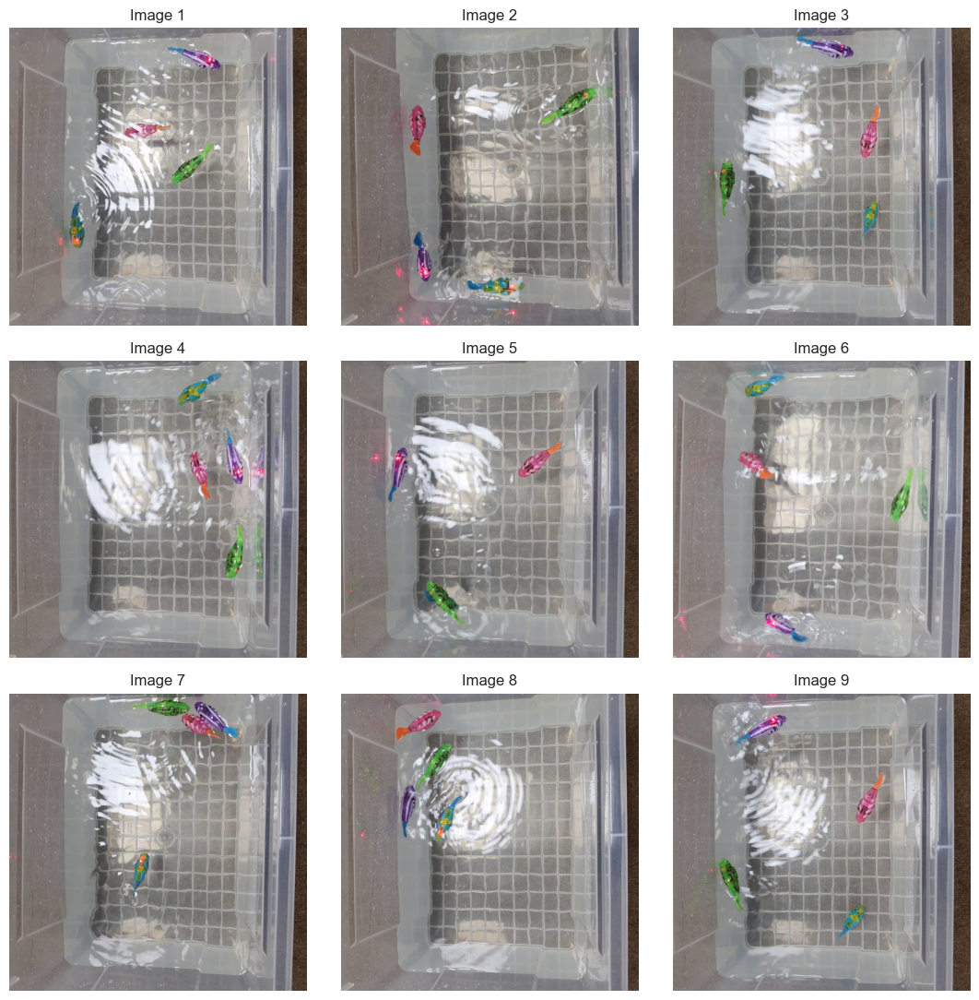

In [14]:
Image_dir = '../Sample_data/train/images'

num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

**5. Get resolution and channel information on one of the images in the train folder**

In [15]:
# Get the size of the image
image = cv2.imread("../Sample_data/train/images/robot_fish_1.png")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

The image has dimensions 1440x1440 and 3 channels.


**6. Object detection from selected images using yolov8s default**

Object detection using YOLO version of COCO dataset


image 1/1 c:\Source\YOLO_Practice\YOLO_V8\Learning\..\Sample_data\train\images\robot_fish_1.png: 640x640 1 toothbrush, 114.8ms
Speed: 7.0ms preprocess, 114.8ms inference, 5.9ms postprocess per image at shape (1, 3, 640, 640)


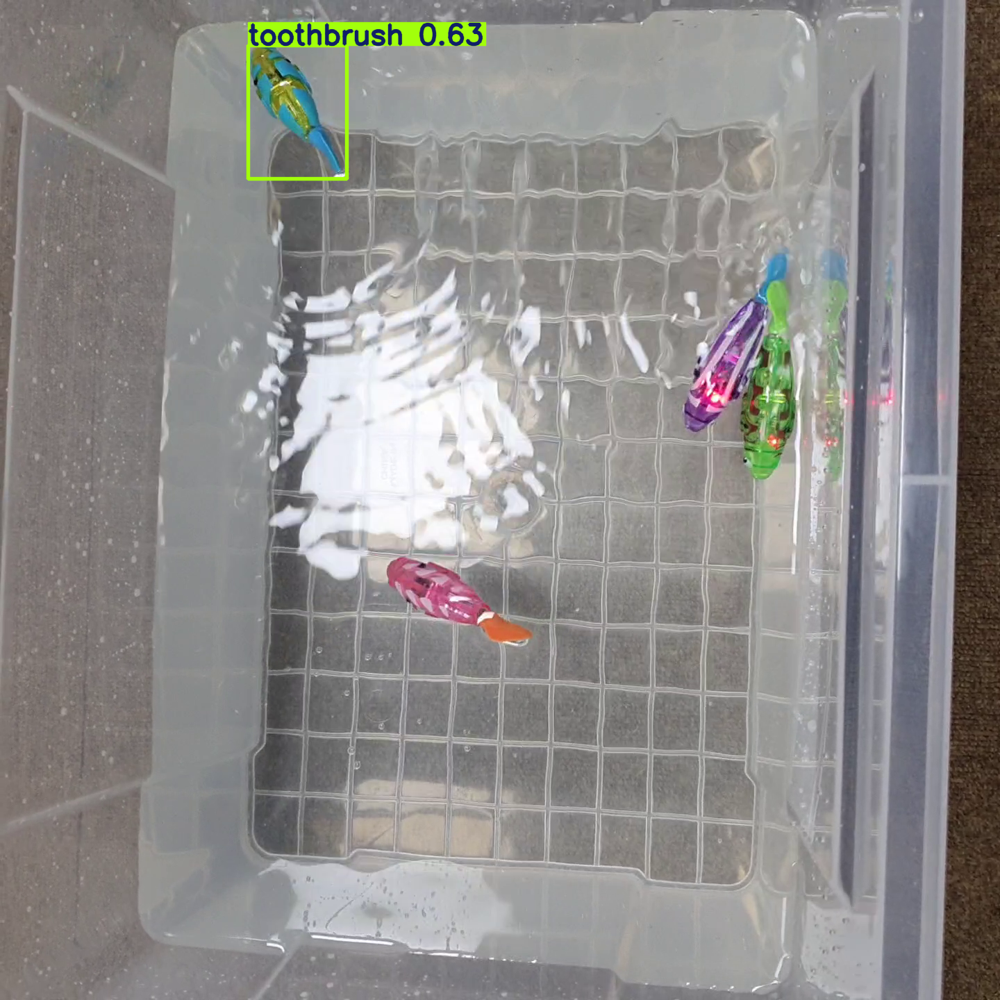

In [16]:
# Use a pretrained YOLOv8n model
model = YOLO("yolov8s.pt") 

# Use the model to detect object
image = "../Sample_data/train/images/robot_fish_1.png"
result_predict = model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

**7. Cell code for YOLO training using guppy-fish-dataset-yolo dataset**

The configuration of training and data augmentation used can be changed according to your wishes.

In [17]:
# Build from YAML and transfer weights
Final_model = YOLO('yolov8s.pt')

# Training The Final Model
Result_Final_model = Final_model.train(
    data="../Sample_data.yaml", 
    epochs = 50, 
    imgsz = 640,
    lr0 = 0.005,
    momentum = 0.9,
    weight_decay = 0.005,
    warmup_epochs = 5,
    warmup_momentum = 0.8,
    warmup_bias_lr = 0.01,
    batch = 32,
    device = 0,

    mosaic = 1.0,
    mixup = 0.0,
    fliplr = 0.5,
    flipud = 0.3,
    degrees = 15.0,
    translate = 0.1,
    scale = 0.3,
    shear = 2.0,
    hsv_h = 0.015,
    hsv_s = 0.7,
    hsv_v = 0.4,

    cache = True,
    verbose = False,
    rect = False,
    cos_lr = True,
    profile = True,
    half=True
    )


Ultralytics 8.3.161  Python-3.10.11 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3060, 12288MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=../Sample_data.yaml, degrees=15.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.3, format=torchscript, fraction=1.0, freeze=None, half=True, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.9, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained

100%|██████████| 5.35M/5.35M [00:00<00:00, 52.5MB/s]


AMP: checks passed 
train: Fast image access  (ping: 0.10.0 ms, read: 425.5143.0 MB/s, size: 2524.8 KB)


train: Scanning C:\Source\YOLO_Practice\YOLO_V8\Sample_data\train\labels... 210 images, 0 backgrounds, 0 corrupt: 100%|██████████| 210/210 [00:01<00:00, 140.53it/s]

train: New cache created: C:\Source\YOLO_Practice\YOLO_V8\Sample_data\train\labels.cache


WARNING cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.2GB RAM): 100%|██████████| 210/210 [00:01<00:00, 198.95it/s]


val: Fast image access  (ping: 0.30.1 ms, read: 136.638.7 MB/s, size: 2500.4 KB)


val: Scanning C:\Source\YOLO_Practice\YOLO_V8\Sample_data\valid\labels... 45 images, 0 backgrounds, 0 corrupt: 100%|██████████| 45/45 [00:00<00:00, 98.98it/s]

val: New cache created: C:\Source\YOLO_Practice\YOLO_V8\Sample_data\valid\labels.cache


WARNING cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.1GB RAM): 100%|██████████| 45/45 [00:00<00:00, 156.25it/s]


Plotting labels to c:\Source\YOLO_Practice\runs\detect\train4\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.005' and 'momentum=0.9' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to c:\Source\YOLO_Practice\runs\detect\train4
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      7.09G      2.453      3.731      2.026         94        640: 100%|██████████| 7/7 [00:03<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all         45        180      0.252      0.233      0.189     0.0968



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      6.69G      1.834      2.103      1.563         98        640: 100%|██████████| 7/7 [00:02<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all         45        180      0.885      0.861      0.941      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      6.76G       1.38      1.122      1.265        114        640: 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         45        180      0.499      0.533      0.597      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      6.89G      1.366     0.9121      1.273         85        640: 100%|██████████| 7/7 [00:02<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

                   all         45        180      0.092      0.933     0.0925     0.0645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      6.85G      1.363     0.8725      1.273        106        640: 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

                   all         45        180     0.0951       0.85     0.0935     0.0591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      6.85G      1.324     0.7487       1.25        102        640: 100%|██████████| 7/7 [00:02<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all         45        180       0.55      0.739      0.576      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      6.85G      1.343      0.759      1.261        105        640: 100%|██████████| 7/7 [00:02<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all         45        180      0.755      0.719      0.745       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      6.76G      1.305     0.7319      1.241        105        640: 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

                   all         45        180     0.0287      0.156      0.021    0.00744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      6.76G      1.286     0.7043      1.229         90        640: 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

                   all         45        180    0.00495      0.289    0.00316    0.00117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      6.92G       1.29     0.6784      1.228        100        640: 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

                   all         45        180      0.866      0.717      0.802      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      6.85G      1.284     0.7184      1.237         71        640: 100%|██████████| 7/7 [00:02<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

                   all         45        180      0.818      0.739      0.786      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      6.82G      1.212     0.6695      1.187         90        640: 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

                   all         45        180    0.00712      0.494    0.00533    0.00311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      7.15G      1.229     0.6491      1.178        116        640: 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

                   all         45        180     0.0848      0.644     0.0827     0.0511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      6.91G       1.25     0.6713      1.202         96        640: 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

                   all         45        180       0.96      0.928      0.966      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      7.19G      1.204     0.6687      1.197        111        640: 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

                   all         45        180       0.93      0.737      0.844      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      6.81G      1.174     0.6479      1.167         83        640: 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         45        180      0.683      0.833      0.744      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      7.14G       1.11      0.603      1.149         81        640: 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all         45        180      0.269      0.383      0.187     0.0557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      6.82G      1.228     0.6378      1.187        112        640: 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

                   all         45        180      0.907      0.844      0.922      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      7.05G      1.057     0.5927      1.121        105        640: 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

                   all         45        180      0.938      0.836      0.885      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      6.91G      1.097     0.5903      1.135        101        640: 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

                   all         45        180      0.897      0.825      0.872        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      6.85G      1.079      0.577      1.113        109        640: 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

                   all         45        180      0.426      0.739      0.384      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      6.91G      1.061     0.5775       1.13         89        640: 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         45        180      0.989      0.985      0.994      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      7.15G      1.093     0.5646      1.128        100        640: 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all         45        180      0.967      0.963      0.992      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      6.95G       1.06     0.5341      1.103        110        640: 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

                   all         45        180      0.984      0.983       0.99      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      6.76G       1.08      0.569      1.128        107        640: 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

                   all         45        180      0.962      0.985      0.993       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      6.95G      1.024      0.542      1.091        107        640: 100%|██████████| 7/7 [00:02<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all         45        180       0.99          1      0.995      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      6.86G      1.054     0.5432      1.103        114        640: 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all         45        180      0.987          1      0.995      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      6.95G      1.008     0.5393      1.102         99        640: 100%|██████████| 7/7 [00:02<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all         45        180      0.991          1      0.995      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      6.85G     0.9499     0.5161      1.067         91        640: 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

                   all         45        180      0.939          1      0.995      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      6.82G      1.016     0.5156       1.09         96        640: 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

                   all         45        180      0.943      0.994      0.992      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      6.86G     0.9908     0.5137      1.083        104        640: 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

                   all         45        180       0.96      0.994      0.993      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      6.91G     0.9552     0.4944      1.063        102        640: 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all         45        180      0.989      0.995      0.995      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      6.85G     0.9015     0.4789      1.035        104        640: 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

                   all         45        180      0.994      0.995      0.995      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       6.9G     0.9205     0.4858      1.055         99        640: 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

                   all         45        180      0.999          1      0.995      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.76G     0.8877     0.4697      1.036         86        640: 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

                   all         45        180      0.999          1      0.995      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      6.96G     0.8867     0.4617       1.03        114        640: 100%|██████████| 7/7 [00:02<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

                   all         45        180      0.999          1      0.995        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      6.76G     0.8862     0.4572      1.031         81        640: 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

                   all         45        180      0.999          1      0.995      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      6.92G     0.8717     0.4449      1.031         84        640: 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

                   all         45        180      0.993          1      0.995      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      6.76G     0.8755     0.4581      1.025        105        640: 100%|██████████| 7/7 [00:02<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

                   all         45        180      0.994          1      0.995      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      6.82G     0.8615     0.4477      1.032         89        640: 100%|██████████| 7/7 [00:02<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all         45        180      0.999          1      0.995      0.821


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      6.81G       0.77      0.342     0.9647         72        640: 100%|██████████| 7/7 [00:02<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         45        180      0.998          1      0.995       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      6.87G     0.7626     0.3485     0.9634         72        640: 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all         45        180      0.997          1      0.995       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      6.81G     0.7625     0.3388     0.9677         71        640: 100%|██████████| 7/7 [00:02<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

                   all         45        180      0.997          1      0.995      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      6.87G     0.7325     0.3328     0.9468         71        640: 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all         45        180      0.995          1      0.995      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      6.81G     0.7528     0.3336      0.956         72        640: 100%|██████████| 7/7 [00:02<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

                   all         45        180      0.996          1      0.995      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      6.86G     0.7353      0.326     0.9415         72        640: 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

                   all         45        180      0.997          1      0.995      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      6.81G     0.7359      0.324     0.9559         72        640: 100%|██████████| 7/7 [00:02<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         45        180      0.998          1      0.995      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      6.87G     0.7258     0.3258     0.9545         72        640: 100%|██████████| 7/7 [00:02<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

                   all         45        180      0.998          1      0.995      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      6.81G     0.7087     0.3141     0.9337         72        640: 100%|██████████| 7/7 [00:02<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

                   all         45        180      0.998          1      0.995      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      6.87G     0.7379      0.321     0.9474         71        640: 100%|██████████| 7/7 [00:02<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all         45        180      0.998          1      0.995      0.815



50 epochs completed in 0.055 hours.
Optimizer stripped from c:\Source\YOLO_Practice\runs\detect\train4\weights\last.pt, 22.5MB
Optimizer stripped from c:\Source\YOLO_Practice\runs\detect\train4\weights\best.pt, 22.5MB

Validating c:\Source\YOLO_Practice\runs\detect\train4\weights\best.pt...
Ultralytics 8.3.161  Python-3.10.11 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3060, 12288MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


                   all         45        180      0.997          1      0.995      0.828
Speed: 0.1ms preprocess, 3.3ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to c:\Source\YOLO_Practice\runs\detect\train4


**8. Displays training results.**

The training results in question are in the form of confusion matrix, F1-score graph, Precision, Recall, and others that are needed for analysis.

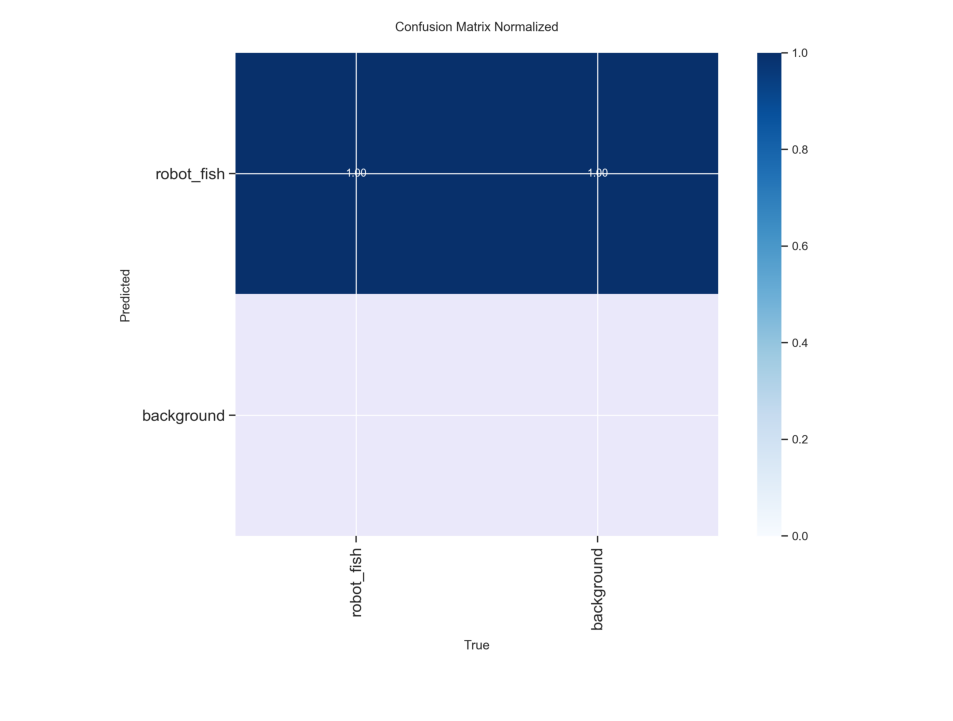

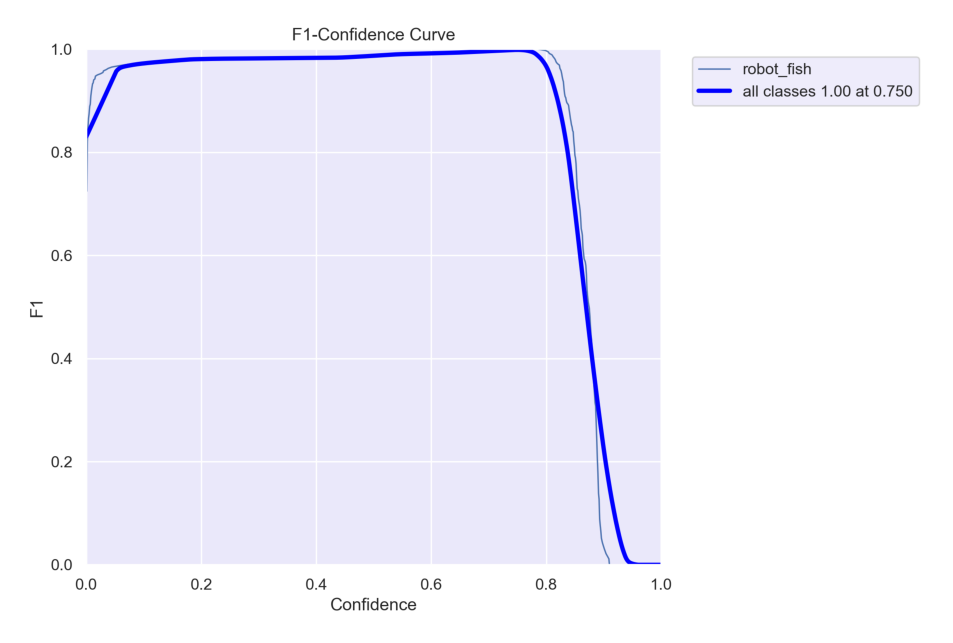

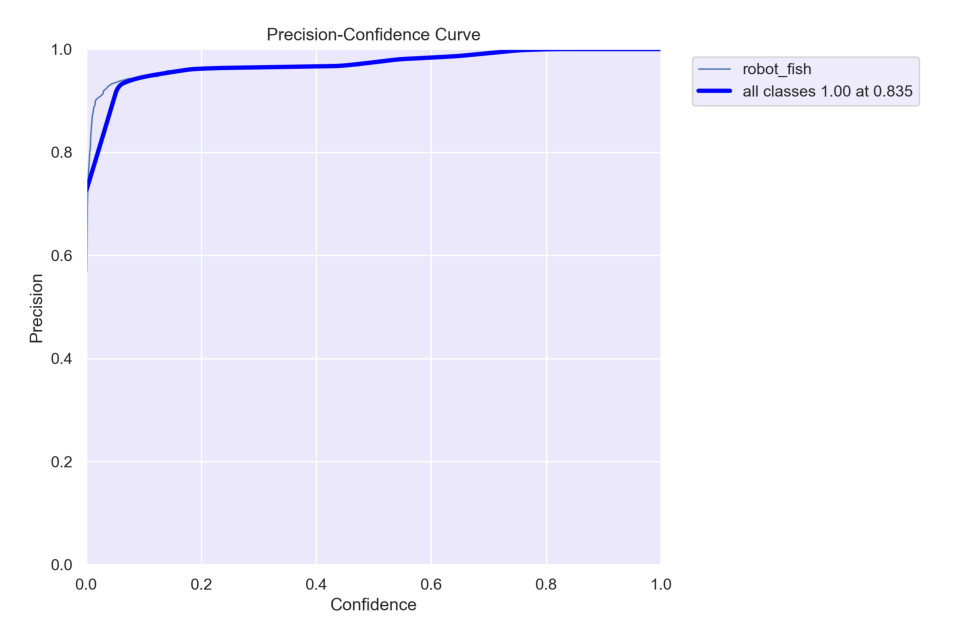

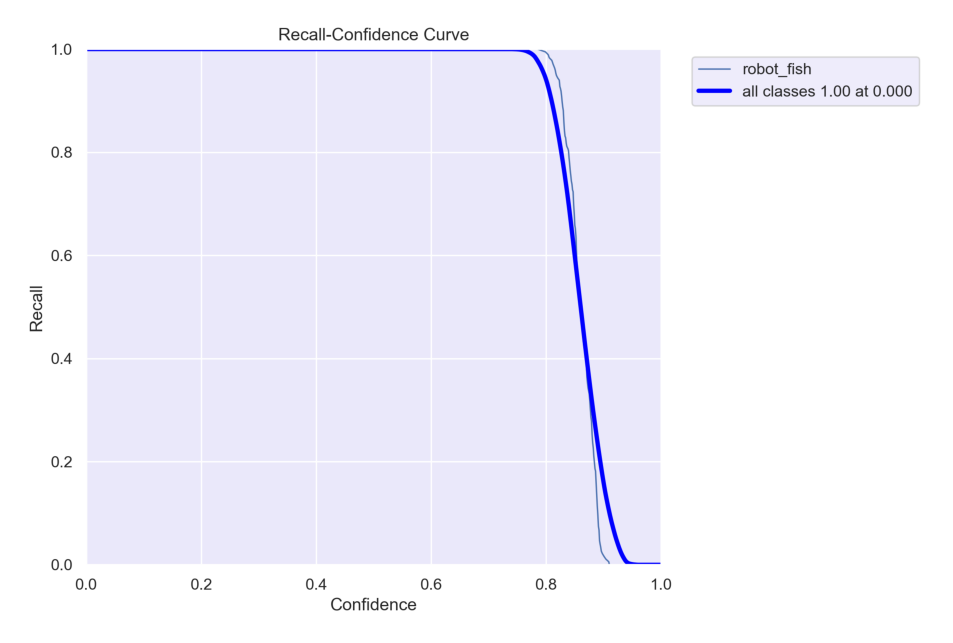

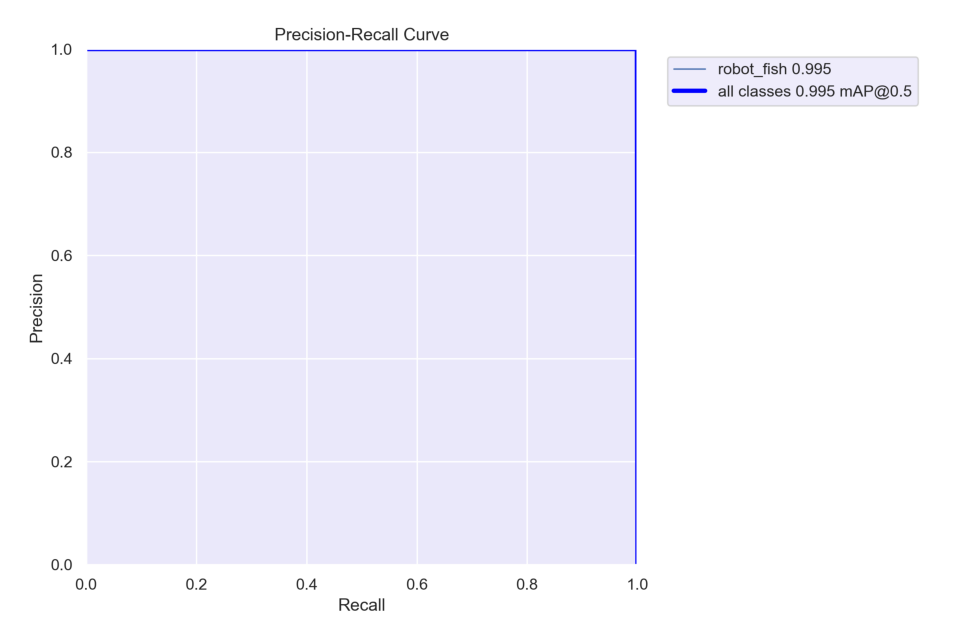

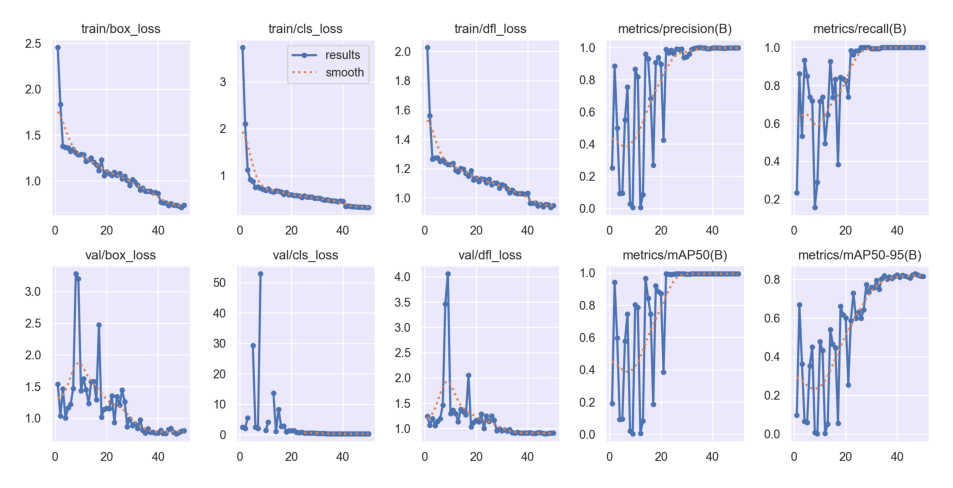

In [18]:
import os
import cv2
import matplotlib.pyplot as plt

def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = 'C:/Source/YOLO_Practice/runs/detect/train4'

# Display the images
display_images(post_training_files_path, image_files)


**9. Display training results in csv format**

In [19]:
Result_Final_model = pd.read_csv('C:/Source/YOLO_Practice/runs/detect/train4/results.csv')
Result_Final_model.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
40,41,166.803,0.77005,0.34200,0.96474,0.99784,1.0,0.995,0.81046,0.80803,0.32026,0.91861,0.000209,0.000209,0.000209
41,42,170.373,0.76256,0.34849,0.96338,0.99719,1.0,0.995,0.82000,0.76153,0.31757,0.90555,0.000174,0.000174,0.000174
42,43,173.830,0.76248,0.33875,0.96769,0.99689,1.0,0.995,0.81674,0.76329,0.32029,0.90278,0.000142,0.000142,0.000142
43,44,177.330,0.73255,0.33280,0.94678,0.99534,1.0,0.995,0.81151,0.81995,0.32478,0.91575,0.000114,0.000114,0.000114
44,45,180.776,0.75280,0.33363,0.95601,0.99589,1.0,0.995,0.80570,0.83982,0.32529,0.92069,0.000090,0.000090,0.000090
45,46,184.264,0.73525,0.32596,0.94145,0.99702,1.0,0.995,0.82199,0.78043,0.31404,0.90317,0.000068,0.000068,0.000068
46,47,187.808,0.73586,0.32396,0.95587,0.99753,1.0,0.995,0.82848,0.75533,0.30904,0.89653,0.000051,0.000051,0.000051
47,48,191.383,0.72583,0.32578,0.95454,0.99770,1.0,0.995,0.82146,0.77437,0.30847,0.90133,0.000038,0.000038,0.000038
48,49,194.883,0.70865,0.31406,0.93370,0.99772,1.0,0.995,0.81676,0.79902,0.31182,0.90818,0.000028,0.000028,0.000028
49,50,198.382,0.73789,0.32100,0.94738,0.99764,1.0,0.995,0.81509,0.80477,0.31255,0.91025,0.000022,0.000022,0.000022


**10. Creating a graph from data in a csv file**

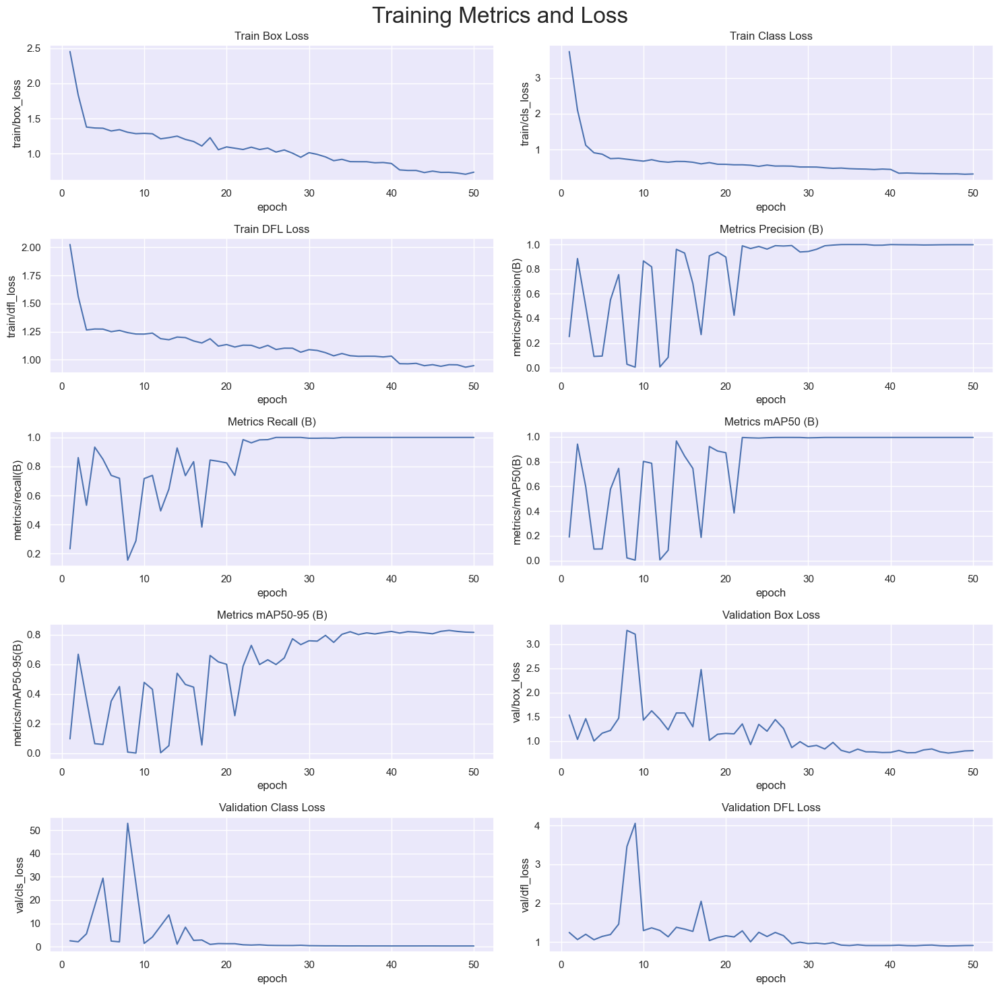

In [20]:
# Read the results.csv file as a pandas dataframe
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

**11. Performing model performance validation**

In [21]:
# Loading the best performing model
Valid_model = YOLO('C:/Source/YOLO_Practice/runs/detect/train4/weights/best.pt')

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.161  Python-3.10.11 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3060, 12288MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 1173.895.6 MB/s, size: 2485.3 KB)


val: Scanning C:\Source\YOLO_Practice\YOLO_V8\Sample_data\valid\labels.cache... 45 images, 0 backgrounds, 0 corrupt: 100%|██████████| 45/45 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


                   all         45        180      0.998          1      0.995       0.83
Speed: 3.2ms preprocess, 13.7ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to c:\Source\YOLO_Practice\runs\detect\val4
precision(B):  0.9975227624082246
metrics/recall(B):  1.0
metrics/mAP50(B):  0.995
metrics/mAP50-95(B):  0.8304252974359004


**12. Detecting guppy fish in 9 random images on the dataset using the trained YOLO model.**


0: 640x640 4 robot_fishs, 105.8ms
Speed: 5.9ms preprocess, 105.8ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 robot_fishs, 70.0ms
Speed: 3.3ms preprocess, 70.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 robot_fishs, 40.8ms
Speed: 3.0ms preprocess, 40.8ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 robot_fishs, 40.3ms
Speed: 2.8ms preprocess, 40.3ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 robot_fishs, 38.8ms
Speed: 2.9ms preprocess, 38.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 robot_fishs, 37.8ms
Speed: 2.8ms preprocess, 37.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 robot_fishs, 37.7ms
Speed: 2.6ms preprocess, 37.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 robot_fishs, 38.4ms
Speed: 4.7ms preprocess, 38.4ms inference, 1.8m

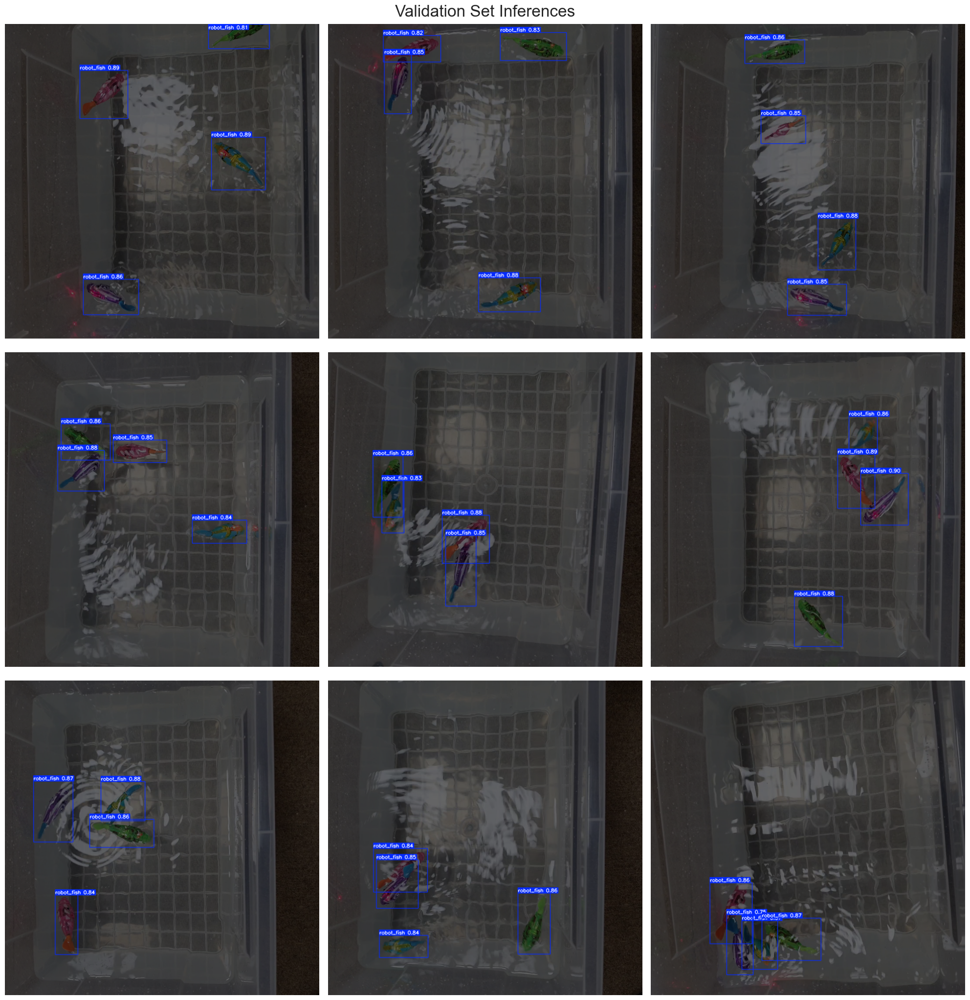

In [22]:
# Normalization function
def normalize_image(image):
    return image / 640.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to validation images
dataset_path = '../Sample_data/'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.png')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])
            
            # Load image
            image = cv2.imread(image_path)
            
            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)
                
                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
                
                # Predict with the model
                results = Valid_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)
                
                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()


In [23]:
# 영상 및 모델 경로
video_path = 'C:/Source/YOLO_Practice/YOLO_V8/Sample_data/robot_fish.mp4'
model = YOLO('C:/Source/YOLO_Practice/runs/detect/train4/weights/best.pt')

# 비디오 캡처 열기
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)

# 🔧 첫 프레임을 읽어 회전하고, 정확한 크기 측정
ret, frame = cap.read()
if not ret:
    raise RuntimeError("영상을 읽을 수 없습니다.")

# 프레임 회전 (반시계 90도)
# frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
height, width = frame.shape[:2]

# VideoWriter 초기화 (회전된 프레임 크기 사용)
out = cv2.VideoWriter('output_detected.mp4',
                      cv2.VideoWriter_fourcc(*'mp4v'),
                      fps, (width, height))

# 🔁 첫 프레임 처리
results = model.predict(source=frame, conf=0.5, verbose=False)
annotated_frame = results[0].plot()
out.write(annotated_frame)
cv2.imshow("Detected", annotated_frame)
cv2.waitKey(1)

# 🔁 나머지 프레임 반복 처리
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
    results = model.predict(source=frame, conf=0.5, verbose=False)
    annotated_frame = results[0].plot()
    out.write(annotated_frame)

    cv2.imshow("Detected", annotated_frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()


In [5]:
import cv2
import torch
import argparse
import numpy as np
if not hasattr(np, 'float'):
    np.float = float
from ultralytics import YOLO
from yolox.tracker.byte_tracker import BYTETracker

# 🔍 모델 및 영상 경로
video_path = '../YOLO_V8/video_aquascape_2.mp4'
model = YOLO('../runs/detect/train/weights/best.pt')

# 🔧 ByteTrack 설정
tracker_args = {
    'track_thresh': 0.5,
    'match_thresh': 0.8,
    'track_buffer': 30,
    'frame_rate': 30,
    'min_box_area': 100,
    'iou_thresh': 0.5,
    'mot20': False
}
tracker_args = argparse.Namespace(**tracker_args)

tracker = BYTETracker(tracker_args, frame_rate=tracker_args.frame_rate)

# 🎥 비디오 열기
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)

# ▶ 첫 프레임 읽기 및 회전
ret, frame = cap.read()
if not ret:
    raise RuntimeError("영상을 읽을 수 없습니다.")
frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
height, width = frame.shape[:2]

# 📼 저장용 VideoWriter 설정
out = cv2.VideoWriter('output_tracked.mp4',
                      cv2.VideoWriter_fourcc(*'mp4v'),
                      fps, (width, height))

# ▶▶ 첫 프레임 처리
results = model.predict(source=frame, conf=0.5, verbose=False)[0]
detections = []

for det in results.boxes:
    cls_id = int(det.cls)
    if cls_id != 0:  # '물고기' 클래스만 추적
        continue
    x1, y1, x2, y2 = map(int, det.xyxy[0])
    conf = float(det.conf[0])
    detections.append([x1, y1, x2 - x1, y2 - y1, conf])

dets_tensor = torch.tensor(detections) if detections else torch.empty((0, 5))
online_targets = tracker.update(dets_tensor, frame.shape[:2], frame.shape[:2])

# 🔍 시각화 (ID 포함)
for track in online_targets:
    x, y, w, h = map(int, track.tlwh)
    tid = track.track_id
    cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(frame, f'ID: {tid}', (x, y - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

out.write(frame)
cv2.imshow("Tracked", frame)
cv2.waitKey(1)

# 🔁 이후 프레임 반복
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
    results = model.predict(source=frame, conf=0.5, verbose=False)[0]

    detections = []
    for det in results.boxes:
        cls_id = int(det.cls)
        if cls_id != 0:
            continue
        x1, y1, x2, y2 = map(int, det.xyxy[0])
        conf = float(det.conf[0])
        detections.append([x1, y1, x2 - x1, y2 - y1, conf])

    dets_tensor = torch.tensor(detections) if detections else torch.empty((0, 5))
    online_targets = tracker.update(dets_tensor, frame.shape[:2], frame.shape[:2])

    for track in online_targets:
        x, y, w, h = map(int, track.tlwh)
        tid = track.track_id
        cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(frame, f'ID: {tid}', (x, y - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    out.write(frame)
    cv2.imshow("Tracked", frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# 자원 정리
cap.release()
out.release()
cv2.destroyAllWindows()


In [ ]:
import cv2
import argparse
from yolox.tracker.byte_tracker import BYTETracker

# 영상 및 모델 경로
video_path = '../YOLO_V8/video_aquascape_2.mp4'
model = YOLO('../runs/detect/train/weights/best.pt')

# 비디오 캡처 열기
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)

# 첫 프레임을 읽어 회전하고, 정확한 크기 측정
ret, frame = cap.read()
if not ret:
    raise RuntimeError("영상을 읽을 수 없습니다.")
frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
height, width = frame.shape[:2]

# VideoWriter 초기화
out = cv2.VideoWriter('output_detected_with_tracking.mp4',
                      cv2.VideoWriter_fourcc(*'mp4v'),
                      fps, (width, height))

# ByteTrack 초기화
tracker_args = {
    'track_thresh': 0.5,
    'match_thresh': 0.8,
    'track_buffer': 30,
    'frame_rate': 30,
    'min_box_area': 100,
    'iou_thresh': 0.5,
    'mot20': False
}
tracker_args = argparse.Namespace(**tracker_args)
tracker = BYTETracker(tracker_args, frame_rate=tracker_args.frame_rate)

# 객체 추적 결과를 저장할 리스트
tracking_results = []

# 나머지 프레임 반복 처리
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)

    # YOLO 객체 감지
    results = model.predict(source=frame, conf=0.5, verbose=False)
    detections = results[0].boxes.data.cpu().numpy()

    # ByteTrack을 사용하여 객체 추적
    detections_for_tracker = []
    for det in detections:
        x1, y1, x2, y2, conf, cls = det
        center_x = (x1 + x2) / 2
        center_y = (y1 + y2) / 2
        width = x2 - x1
        height = y2 - y1
        detections_for_tracker.append([center_x, center_y, width, height, conf])

    # 추적된 객체
    online_tracks = tracker.update(detections_for_tracker)

    # 추적된 객체 결과를 JSON 형식으로 저장
    for track in online_tracks:
        track_id = track[4]  # 객체 ID
        x1, y1, x2, y2 = track[0], track[1], track[0] + track[2], track[1] + track[3]  # 객체의 좌표
        tracking_results.append({
            "track_id": track_id,
            "bbox": [x1, y1, x2, y2],
            "confidence": track[5]
        })
        
        # 감지된 객체에 대한 라벨링
        cv2.putText(frame, f'ID: {int(track_id)}', (int(x1), int(y1)-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 2)
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (255, 0, 0), 2)

    # 결과를 비디오에 저장
    out.write(frame)

    # 추적된 객체를 화면에 표시
    cv2.imshow("Detected and Tracked", frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()

# 추적된 결과를 JSON 파일로 저장
import json
with open('tracking_results.json', 'w') as f:
    json.dump(tracking_results, f, indent=4)

TypeError: BYTETracker.update() missing 2 required positional arguments: 'img_info' and 'img_size'

: 